In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn

In [2]:
out = torch.Tensor([0.6842, 0.1459, 0.3867, 0.3546, 0.2545, 0.1160, 0.3409, 0.0818, 0.1081])
lbl = torch.Tensor([0.6842, 0.1400, 0.6842, 0.5789, 0.3026, 0.1579, 0.7368, 0.1842, 0.1579])

torch.sum(torch.abs(torch.sub(out, lbl))) / len(lbl)

tensor(0.1295)

In [23]:
out = out * (19*12)
lbl = lbl * (19*12)
torch.sum(torch.abs(torch.sub(out, lbl))) / len(lbl)

tensor(29.5336)

In [41]:
lbl = torch.round(lbl)
out = torch.round(out)

ab = torch.abs(lbl - out)

ab, len(np.where(ab.numpy() <= 4)[0]), (len(lbl) - torch.count_nonzero(ab)).item()

(tensor([ 0.,  1., 68., 51., 11., 10., 90., 23., 11.]), 2, 1)

In [3]:
path_to_data = '/Users/janbraunsdorff/Studienarbeit-projekt/data'
path_to_validation_annotation = path_to_data + "/validation.csv"
path_to_training_annotation = path_to_data + "/training.csv"
path_to_validatoin_data = path_to_data + '/boneage-validation-dataset/'
path_to_training_data = path_to_data + '/boneage-training-dataset/'
path = path_to_data + '/pickel/v3'

In [4]:
def processImages(img_path, size_target=256):
    img = cv2.imread(img_path)

    size_target = 500
    img = cv2.resize(img, (size_target, size_target), interpolation=cv2.INTER_LINEAR)

    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab_planes = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

    x = y = (size_target - 299) // 2

    h = w = 299
    crop_img = bgr[y:y + h, x:x + w]
    
    return crop_img

In [4]:
def print_steps(file_path):
    plt.rcParams["figure.figsize"] = (16, 5)
    plt.rcParams["figure.dpi"] = 299
    num = 6

    f = plt.figure()


    f.add_subplot(1, num, 1)
    plt.imshow(cv2.imread(file_path), cmap='gray', vmin=0, vmax=255)
    plt.axis('off')
    plt.title('Original')


    f.add_subplot(1, num, 2)
    img = cv2.imread(file_path)
    size_target = 500
    img = cv2.resize(img, (size_target, size_target), interpolation=cv2.INTER_LINEAR)
    plt.imshow(img, cmap='gray', vmin=0, vmax=255)
    plt.axis('off')
    plt.title('Resize 500x500')



    f.add_subplot(1, num, 3)
    img = cv2.imread(file_path)
    size_target = 500
    img = cv2.resize(img, (size_target, size_target), interpolation=cv2.INTER_LINEAR)
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab_planes = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    plt.imshow(bgr, cmap='gray', vmin=0, vmax=255)
    plt.axis('off')
    plt.title('CLAHE Filter')



    f.add_subplot(1, num, 4)
    img = cv2.imread(file_path)
    size_target = 400
    img = cv2.resize(img, (size_target, size_target), interpolation=cv2.INTER_LINEAR)
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab_planes = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    x = y = (size_target - 256) // 2
    h = w = 256
    crop_img = bgr[y:y + h, x:x + w]
    plt.imshow(crop_img, cmap='gray', vmin=0, vmax=255)
    plt.axis('off')
    plt.title('Crop')


    f.add_subplot(1, num, 5)
    img = cv2.imread(file_path)
    size_target = 500
    img = cv2.resize(img, (size_target, size_target), interpolation=cv2.INTER_LINEAR)

    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab_planes = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)


    x = y = (size_target - 299) // 2
    h = w = 299
    img = bgr[y:y + h, x:x + w]

    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab_planes = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    img = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

    #kernel = np.ones((2,2),np.uint8)
    #img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

    plt.imshow(img, cmap='gray', vmin=0, vmax=1)
    plt.axis('off')
    plt.title('CLAHE')


    f.add_subplot(1, num, 6)
    img = cv2.imread(file_path)
    size_target = 550
    img = cv2.resize(img, (size_target, size_target), interpolation=cv2.INTER_LINEAR)

    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab_planes = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)


    x = y = (size_target - 400) // 2
    h = w = 400
    img = bgr[y:y + h, x:x + w]

    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab_planes = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    img = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

    kernel = np.ones((2,2),np.uint8)
    img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

    plt.imshow(img, cmap='gray', vmin=0, vmax=255)
    plt.axis('off')
    plt.title('Open')


    plt.show()

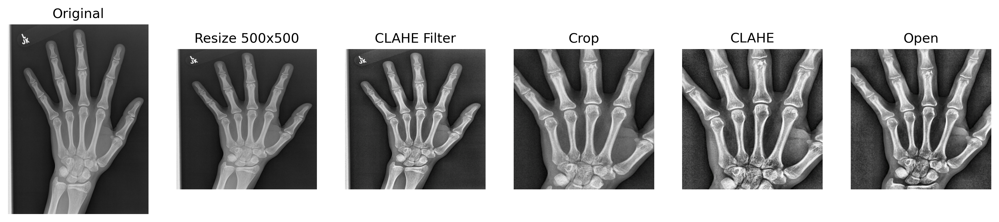

In [5]:
file_path = path_to_training_data+ "1377.png"
print_steps(file_path)

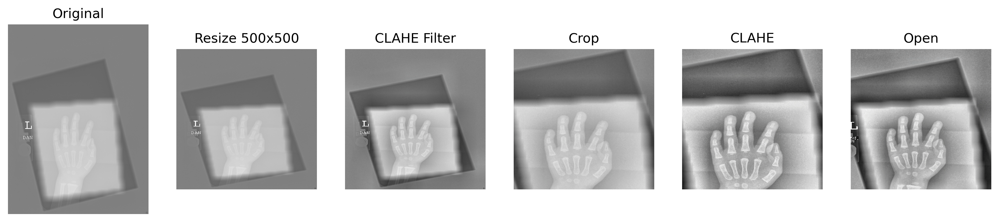

In [6]:
file_path = path_to_training_data+ "1378.png"
print_steps(file_path)

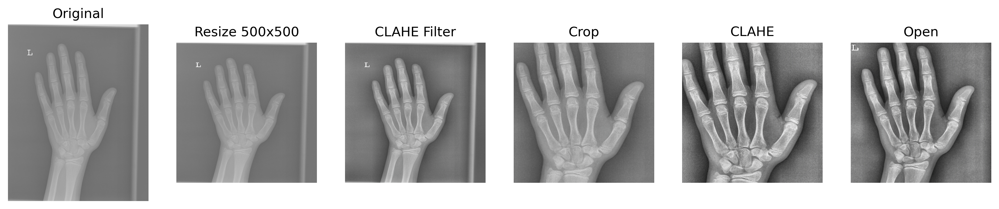

In [7]:
file_path = path_to_training_data+ "1390.png"
print_steps(file_path)

In [7]:
def pre_process(file_path, resize_to=500, reduce_to=380, out_to=299):
    img = cv2.imread(file_path)
    size_target = resize_to
    img = cv2.resize(img, (resize_to, resize_to), interpolation=cv2.INTER_LINEAR)

    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab_planes = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)


    x = y = (size_target - reduce_to) // 2
    h = w = reduce_to
    img = bgr[y:y + h, x:x + w]

    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab_planes = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    img = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

    kernel = np.ones((2,2),np.uint8)
    img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

    img = cv2.resize(img, (out_to, out_to), interpolation=cv2.INTER_LINEAR)

    return img

In [10]:
def pre_process_alt(file_path, resize_to=500, reduce_to=380, out_to=299):
    img = cv2.imread(file_path)
    size_target = 450
    img = cv2.resize(img, (resize_to, resize_to), interpolation=cv2.INTER_LINEAR)

    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab_planes = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)


    x = y = (450 - 299) // 2
    h = w = 299
    img = bgr[y:y + h, x:x + w]

    return img

Text(0.5, 1.0, 'Neu')

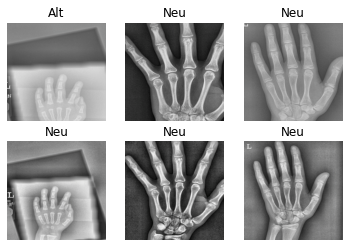

In [14]:
f = plt.figure()
f.add_subplot(2, 3, 4)
file_path = path_to_training_data+ "1378.png"
plt.imshow(pre_process(file_path), cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.title('Neu')

f.add_subplot(2, 3, 5)
file_path = path_to_training_data+ "1377.png"
plt.imshow(pre_process(file_path), cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.title('Neu')

f.add_subplot(2, 3, 6)
file_path = path_to_training_data+ "1390.png"
plt.imshow(pre_process(file_path), cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.title('Neu')

f.add_subplot(2, 3, 1)
file_path = path_to_training_data+ "1378.png"
plt.imshow(pre_process_alt(file_path), cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.title('Alt')

f.add_subplot(2, 3, 2)
file_path = path_to_training_data+ "1377.png"
plt.imshow(pre_process_alt(file_path), cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.title('Neu')

f.add_subplot(2, 3, 3)
file_path = path_to_training_data+ "1390.png"
plt.imshow(pre_process_alt(file_path), cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.title('Neu')

In [30]:
"test{:6}".format(123)

'test   123'